In [10]:
# --- 1. Setup and Imports ---
# This cell imports all the necessary libraries for the notebook.
# It's a standard practice to keep all imports at the top for clarity and organization.

# Standard Python libraries for interacting with the file system, system-level operations,
# memory management (garbage collection), handling JSON files, and file operations.
import os
import sys
import gc
import json
import shutil
import warnings
# This line suppresses warning messages to keep the output clean.
warnings.filterwarnings('ignore')
# Pathlib provides an object-oriented interface for filesystem paths.
from pathlib import Path
# A specialized dictionary that provides a default value for non-existent keys.
from collections import defaultdict
# Typing hints for better code readability and static analysis.
from typing import List, Dict, Optional, Tuple
# A function to display pandas/polars DataFrames nicely in the notebook.
from IPython.display import display

# --- Data Handling Libraries ---
# NumPy is the fundamental package for numerical computation in Python.
import numpy as np
# Polars is a fast, modern DataFrame library used by the competition's API.
import polars as pl
# Pandas is another powerful data manipulation library, often used for EDA.
import pandas as pd

# --- Medical Imaging Libraries ---
# Pydicom is the essential library for reading, modifying, and writing DICOM files.
import pydicom
# OpenCV (cv2) is used for various image processing tasks like resizing and color conversion.
import cv2

# --- Machine Learning & Deep Learning Libraries ---
# PyTorch is the primary deep learning framework used here.
import torch
import torch.nn as nn
import torch.nn.functional as F
# Autocast enables automatic mixed-precision training/inference for better performance on GPUs.
from torch.cuda.amp import autocast
# Timm (PyTorch Image Models) is an extensive library of pre-trained vision models.
import timm

# --- Image Transformation Library ---
# Albumentations is a fast and flexible library for image augmentation.
import albumentations as A
# ToTensorV2 converts numpy arrays to PyTorch tensors.
from albumentations.pytorch import ToTensorV2

# --- Competition-Specific API ---
# This module is provided by Kaggle to handle the submission process in a code competition.
import kaggle_evaluation.rsna_inference_server

# --- Device Configuration ---
# Set the device to 'cuda' (GPU) if available, otherwise fall back to 'cpu'.
# This ensures the code runs on the most efficient hardware available.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Print the selected device for confirmation.
print(f"Using device: {device}")

Using device: cuda


In [25]:
# --- 2. Constants and Configuration ---

# --- Competition Constants ---
# The name of the column that contains the unique identifier for each DICOM series.
ID_COL = 'SeriesInstanceUID'
# A list of all 14 target labels that the model must predict.
LABEL_COLS = [
    'Left Infraclinoid Internal Carotid Artery', 'Right Infraclinoid Internal Carotid Artery',
    'Left Supraclinoid Internal Carotid Artery', 'Right Supraclinoid Internal Carotid Artery',
    'Left Middle Cerebral Artery', 'Right Middle Cerebral Artery', 'Anterior Communicating Artery',
    'Left Anterior Cerebral Artery', 'Right Anterior Cerebral Artery', 'Left Posterior Communicating Artery',
    'Right Posterior Communicating Artery', 'Basilar Tip', 'Other Posterior Circulation', 'Aneurysm Present',
]

# --- Model Selection ---
# This variable allows for easy switching between different inference strategies.
# Options: 'tf_efficientnetv2_s', 'convnext_small', 'swin_small_patch4_window7_224', or 'ensemble'.
SELECTED_MODEL = 'ensemble' 

# --- Model Paths Configuration ---
# A dictionary mapping model names to their file paths.
# These paths point to pre-trained model weights that must be added as a Kaggle Dataset.
MODEL_PATHS = {
    'tf_efficientnetv2_s': '/kaggle/input/rsna-iad-trained-models/models/tf_efficientnetv2_s_fold0_best.pth',
    'convnext_small': '/kaggle/input/rsna-iad-trained-models/models/convnext_small_fold0_best.pth',
    'swin_small_patch4_window7_224': '/kaggle/input/rsna-iad-trained-models/models/swin_small_patch4_window7_224_fold0_best.pth'
}

# --- Inference Configuration Class ---
# This class holds all settings related to the inference process.
class InferenceConfig:
    # The currently selected model or strategy.
    model_selection = SELECTED_MODEL
    # A boolean flag indicating whether to use the ensemble of all models.
    use_ensemble = (SELECTED_MODEL == 'ensemble')
    
    # Default model settings. These will be updated with values from the model checkpoint file.
    image_size = 512
    num_slices = 32
    use_windowing = True
    
    # Settings for the inference process itself.
    batch_size = 1
    use_amp = True # Use Automatic Mixed Precision for faster inference.
    use_tta = True # Use Test-Time Augmentation for improved accuracy.
    tta_transforms = 4 # Number of TTA views to use (original + 3 augmented).
    
    # Weights for each model if using the ensemble strategy.
    # These weights are typically determined through experimentation on a validation set.
    ensemble_weights = {
        'tf_efficientnetv2_s': 0.4,
        'convnext_small': 0.3,
        'swin_small_patch4_window7_224': 0.3
    }

# Create an instance of the configuration class to be used globally.
CFG = InferenceConfig()


In [12]:
# --- 3. Model Architecture ---
class MultiBackboneModel(nn.Module):
    """
    A flexible PyTorch model that can use different backbones from the 'timm' library.
    This architecture is designed to process a 2D image and associated metadata.
    """
    def __init__(self, model_name, num_classes=14, pretrained=True, 
                 drop_rate=0.3, drop_path_rate=0.2):
        # Call the constructor of the parent class (nn.Module).
        super().__init__()
        
        # Store the name of the model backbone.
        self.model_name = model_name
        
        # Special handling for Swin Transformers, which might have specific image size requirements.
        if 'swin' in model_name:
            # Create the model using timm, but without the final classifier head.
            self.backbone = timm.create_model(
                model_name, 
                pretrained=pretrained, # Use pre-trained weights from ImageNet.
                in_chans=3, # Expect a 3-channel (RGB-like) input image.
                drop_rate=drop_rate, # Dropout rate for regularization.
                drop_path_rate=drop_path_rate, # Stochastic depth for regularization in transformers.
                img_size=CFG.image_size,  # Ensure the model is configured for our specific image size.
                num_classes=0,  # Setting num_classes=0 removes the original classifier head.
                global_pool=''  # We'll add our own pooling layer later.
            )
        else:
            # Create other types of models (e.g., EfficientNet, ConvNeXt).
            self.backbone = timm.create_model(
                model_name, 
                pretrained=pretrained,
                in_chans=3,
                drop_rate=drop_rate,
                drop_path_rate=drop_path_rate,
                num_classes=0,
                global_pool=''
            )
        
        # This block dynamically determines the number of output features from the backbone.
        with torch.no_grad(): # We don't need to calculate gradients for this part.
            # Create a dummy input tensor with the correct dimensions.
            dummy_input = torch.zeros(1, 3, CFG.image_size, CFG.image_size)
            # Pass the dummy input through the backbone to see the output shape.
            features = self.backbone(dummy_input)
            
            # Check the shape of the feature tensor to decide on the pooling strategy.
            if len(features.shape) == 4:
                # Convolutional features: (batch, channels, height, width). We need to pool H and W.
                num_features = features.shape[1]
                self.needs_pool = True
            elif len(features.shape) == 3:
                # Transformer features: (batch, sequence_length, features). We need to pool the sequence.
                num_features = features.shape[-1]
                self.needs_pool = False
                self.needs_seq_pool = True
            else:
                # Already flat features: (batch, features). No pooling needed.
                num_features = features.shape[1]
                self.needs_pool = False
                self.needs_seq_pool = False
        
        # Print the detected feature information for verification.
        print(f"Model {model_name}: detected {num_features} features, output shape: {features.shape}")
        
        # Add a global average pooling layer if the backbone outputs a spatial feature map.
        if self.needs_pool:
            self.global_pool = nn.AdaptiveAvgPool2d(1)
        
        # A small neural network (MLP) to process the metadata (age and sex).
        self.meta_fc = nn.Sequential(
            nn.Linear(2, 16), # Input: 2 features (age, sex), Output: 16 features.
            nn.ReLU(), # Rectified Linear Unit activation function.
            nn.Dropout(0.2), # Dropout for regularization.
            nn.Linear(16, 32), # Second linear layer.
            nn.ReLU()
        )
        
        # The final classifier head that combines image and metadata features.
        self.classifier = nn.Sequential(
            # The input size is the sum of image features and metadata features.
            nn.Linear(num_features + 32, 512),
            # Batch Normalization helps stabilize training.
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(drop_rate),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(drop_rate),
            # The final output layer with 14 neurons for our 14 target labels.
            nn.Linear(256, num_classes)
        )
        
    def forward(self, image, meta):
        # This method defines the forward pass of the model.
        # Pass the image through the backbone to get feature maps.
        img_features = self.backbone(image)
        
        # Apply the correct pooling strategy based on the backbone's output shape.
        if hasattr(self, 'needs_pool') and self.needs_pool:
            img_features = self.global_pool(img_features)
            img_features = img_features.flatten(1) # Flatten to a 1D vector.
        elif hasattr(self, 'needs_seq_pool') and self.needs_seq_pool:
            img_features = img_features.mean(dim=1) # Average over the sequence dimension for transformers.
        elif len(img_features.shape) == 4:
            img_features = F.adaptive_avg_pool2d(img_features, 1).flatten(1)
        elif len(img_features.shape) == 3:
            img_features = img_features.mean(dim=1)
        
        # Pass the metadata through its own small network.
        meta_features = self.meta_fc(meta)
        
        # Concatenate the image features and metadata features along the feature dimension.
        combined = torch.cat([img_features, meta_features], dim=1)
        
        # Pass the combined features through the final classifier to get the logits.
        output = self.classifier(combined)
        
        # Return the raw logits. A sigmoid function will be applied later to get probabilities.
        return output


In [13]:
# --- 4. DICOM Processing Functions ---

# This function applies DICOM windowing to a single image array.
def apply_dicom_windowing(img: np.ndarray, window_center: float, window_width: float) -> np.ndarray:
    """Apply DICOM windowing to convert HU values to an 8-bit grayscale range."""
    # Calculate the lower and upper bounds of the HU window.
    img_min = window_center - window_width // 2
    img_max = window_center + window_width // 2
    # Clip the image array to these bounds.
    img = np.clip(img, img_min, img_max)
    # Linearly scale the clipped values to the [0, 1] range.
    img = (img - img_min) / (img_max - img_min + 1e-7) # Add epsilon to avoid division by zero.
    # Scale to [0, 255] and convert to an 8-bit unsigned integer type.
    return (img * 255).astype(np.uint8)

# This function returns standard windowing parameters for different imaging modalities.
def get_windowing_params(modality: str) -> Tuple[float, float]:
    """Get appropriate windowing parameters (center, width) for different modalities."""
    # A dictionary mapping modality to its typical window settings for brain scans.
    windows = { 'CT': (40, 80), 'CTA': (50, 350), 'MRA': (600, 1200), 'MRI': (40, 80) }
    # Return the parameters for the given modality, or default to CT settings if unknown.
    return windows.get(modality, (40, 80))

# This is the main function to process a full DICOM series from a folder.
def process_dicom_series(series_path: str) -> Tuple[np.ndarray, Dict]:
    """Loads all DICOM files in a series, processes them into a 3D volume, and extracts metadata."""
    # Convert the string path to a Path object for easier manipulation.
    series_path = Path(series_path)
    
    # Recursively find all files ending with '.dcm' in the series directory.
    all_filepaths = [os.path.join(root, file) for root, _, files in os.walk(series_path) for file in files if file.endswith('.dcm')]
    # Sort the file paths to ensure correct slice order.
    all_filepaths.sort()
    
    # If no DICOM files are found, return a default empty volume and metadata.
    if len(all_filepaths) == 0:
        volume = np.zeros((CFG.num_slices, CFG.image_size, CFG.image_size), dtype=np.uint8)
        metadata = {'age': 50, 'sex': 0, 'modality': 'CT'}
        return volume, metadata
    
    # Initialize a list to hold the processed 2D slices and a dictionary for metadata.
    slices = []
    metadata = {}
    
    # Loop through each DICOM file in the series.
    for i, filepath in enumerate(all_filepaths):
        try:
            # Read the DICOM file using pydicom.
            ds = pydicom.dcmread(filepath, force=True)
            # Get the pixel data as a numpy array.
            img = ds.pixel_array.astype(np.float32)
            
            # Handle cases where the image might have multiple frames or be in color.
            if img.ndim == 3:
                if img.shape[-1] == 3: # If it's a color image
                    img = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2GRAY).astype(np.float32)
                else: # If it's a multi-frame grayscale
                    img = img[:, :, 0]
            
            # Extract metadata only from the first slice to ensure consistency.
            if i == 0:
                metadata['modality'] = getattr(ds, 'Modality', 'CT') # Default to CT if modality is missing.
                try: # Safely extract and parse patient age.
                    age_str = getattr(ds, 'PatientAge', '050Y')
                    age = int(''.join(filter(str.isdigit, age_str[:3])) or '50')
                    metadata['age'] = min(age, 100) # Cap age at 100.
                except:
                    metadata['age'] = 50 # Default age if parsing fails.
                try: # Safely extract and encode patient sex.
                    sex = getattr(ds, 'PatientSex', 'M')
                    metadata['sex'] = 1 if sex == 'M' else 0
                except:
                    metadata['sex'] = 0 # Default sex if parsing fails.
            
            # Apply rescale slope and intercept if they exist in the DICOM tags.
            if hasattr(ds, 'RescaleSlope') and hasattr(ds, 'RescaleIntercept'):
                img = img * ds.RescaleSlope + ds.RescaleIntercept
            
            # Apply windowing to the image.
            if CFG.use_windowing:
                window_center, window_width = get_windowing_params(metadata['modality'])
                img = apply_dicom_windowing(img, window_center, window_width)
            else: # Fallback to simple min-max normalization if windowing is disabled.
                img_min, img_max = img.min(), img.max()
                if img_max > img_min:
                    img = ((img - img_min) / (img_max - img_min) * 255).astype(np.uint8)
                else:
                    img = np.zeros_like(img, dtype=np.uint8)
            
            # Resize the 2D slice to the target image size.
            img = cv2.resize(img, (CFG.image_size, CFG.image_size))
            # Add the processed slice to our list.
            slices.append(img)
            
        except Exception as e:
            # Print an error message if a file fails to process and continue.
            print(f"Error processing {filepath}: {e}")
            continue
    
    # Convert the list of slices into a 3D numpy array (volume).
    if len(slices) == 0:
        volume = np.zeros((CFG.num_slices, CFG.image_size, CFG.image_size), dtype=np.uint8)
    else:
        volume = np.array(slices)
        # Sample a fixed number of slices from the volume to ensure consistent depth.
        if len(slices) > CFG.num_slices:
            # If there are more slices than needed, sample equidistantly.
            indices = np.linspace(0, len(slices) - 1, CFG.num_slices).astype(int)
            volume = volume[indices]
        elif len(slices) < CFG.num_slices:
            # If there are fewer slices, pad the volume to the required depth.
            pad_size = CFG.num_slices - len(slices)
            volume = np.pad(volume, ((0, pad_size), (0, 0), (0, 0)), mode='edge')
    
    # Return the final processed volume and its metadata.
    return volume, metadata


In [4]:
# --- 5. Transform Functions ---
def get_inference_transform():
    """Defines the standard transformation pipeline for inference."""
    # A.Compose creates a pipeline of transformations.
    return A.Compose([
        # Normalize the image using ImageNet's mean and standard deviation.
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        # Convert the numpy array to a PyTorch tensor.
        ToTensorV2()
    ])

def get_tta_transforms():
    """Defines a list of transformations for Test-Time Augmentation (TTA)."""
    # Create a list containing multiple augmentation pipelines.
    transforms_list = [
        # Transform 1: The original, non-augmented image.
        A.Compose([
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ]),
        # Transform 2: Horizontally flipped image.
        A.Compose([
            A.HorizontalFlip(p=1.0), # Apply with 100% probability.
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ]),
        # Transform 3: Vertically flipped image.
        A.Compose([
            A.VerticalFlip(p=1.0),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ]),
        # Transform 4: 90-degree rotated image.
        A.Compose([
            A.RandomRotate90(p=1.0),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2()
        ])
    ]
    # Return the list of transform pipelines.
    return transforms_list

In [14]:
# --- 6. Model Loading Functions ---

# --- Global Variables ---
# A dictionary to store the loaded models to avoid reloading them for each test case.
MODELS = {}
# A global variable for the standard inference transform.
TRANSFORM = None
# A global variable for the list of TTA transforms.
TTA_TRANSFORMS = None

# This function loads a single pre-trained model from a specified file path.
def load_single_model(model_name: str, model_path: str) -> nn.Module:
    """Loads a single model's weights and configuration from a checkpoint file."""
    # Print a message indicating which model is being loaded.
    print(f"Loading {model_name} from {model_path}...")
    
    # Check if the model file actually exists.
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Model file not found: {model_path}")
    
    # Load the checkpoint file. 'map_location=device' ensures it's loaded to the correct device.
    # 'weights_only=False' is needed because our checkpoint contains more than just weights.
    checkpoint = torch.load(model_path, map_location=device, weights_only=False)
    
    # --- Configuration Restoration ---
    # Safely get the model and training configurations saved in the checkpoint.
    model_config = checkpoint.get('model_config', {})
    training_config = checkpoint.get('training_config', {})
    
    # Update the global CFG object with the image size used during training. This is crucial for consistency.
    if 'image_size' in training_config:
        CFG.image_size = training_config['image_size']
    
    # --- Model Initialization ---
    # Create a new instance of our model with the correct architecture.
    # 'pretrained=False' since we are about to load our own fine-tuned weights.
    model = MultiBackboneModel(
        model_name=model_name,
        num_classes=training_config.get('num_classes', 14),
        pretrained=False,
        drop_rate=0.0, # Set dropout to 0 for inference.
        drop_path_rate=0.0 # Set drop path to 0 for inference.
    )
    
    # --- Weight Loading ---
    # Load the saved weights into the model architecture.
    model.load_state_dict(checkpoint['model_state_dict'])
    # Move the model to the configured device (GPU).
    model = model.to(device)
    # Set the model to evaluation mode. This is very important!
    model.eval()
    
    # Print the validation score of the loaded model for verification.
    print(f"Loaded {model_name} with best score: {checkpoint.get('best_score', 'N/A'):.4f}")
    
    # Return the loaded and prepared model.
    return model

# This function orchestrates the loading of all models required for the selected strategy.
def load_models():
    """Loads all models required based on the InferenceConfig."""
    # Use global variables to store the loaded models and transforms.
    global MODELS, TRANSFORM, TTA_TRANSFORMS
    
    print("Loading models...")
    
    # If the strategy is 'ensemble', load all models specified in MODEL_PATHS.
    if CFG.use_ensemble:
        for model_name, model_path in MODEL_PATHS.items():
            try:
                MODELS[model_name] = load_single_model(model_name, model_path)
            except Exception as e:
                print(f"Warning: Could not load {model_name}: {e}")
    # Otherwise, load only the single model specified in the config.
    else:
        if CFG.model_selection in MODEL_PATHS:
            model_path = MODEL_PATHS[CFG.model_selection]
            MODELS[CFG.model_selection] = load_single_model(CFG.model_selection, model_path)
        else:
            raise ValueError(f"Unknown model: {CFG.model_selection}")
    
    # Initialize the transformation pipelines.
    TRANSFORM = get_inference_transform()
    if CFG.use_tta:
        TTA_TRANSFORMS = get_tta_transforms()
    
    # Print the names of the loaded models.
    print(f"Models loaded: {list(MODELS.keys())}")
    
    # --- Model Warm-up ---
    # This step runs a single forward pass to initialize CUDA kernels and optimize GPU memory.
    print("Warming up models...")
    dummy_image = torch.randn(1, 3, CFG.image_size, CFG.image_size).to(device)
    dummy_meta = torch.randn(1, 2).to(device)
    
    # Run the warm-up pass without calculating gradients.
    with torch.no_grad():
        for model in MODELS.values():
            _ = model(dummy_image, dummy_meta)
    
    # Confirmation message.
    print("Ready for inference!")


In [15]:
# --- 7. Prediction Functions ---

def predict_single_model(model: nn.Module, image: np.ndarray, meta_tensor: torch.Tensor) -> np.ndarray:
    """Makes a prediction for a single image using a single model, with optional TTA."""
    # A list to store predictions from different augmentations.
    predictions = []
    
    # Check if Test-Time Augmentation is enabled.
    if CFG.use_tta and TTA_TRANSFORMS:
        # Loop through the defined TTA transformation pipelines.
        for transform in TTA_TRANSFORMS[:CFG.tta_transforms]:
            # Apply the augmentation to the image.
            aug_image = transform(image=image)['image']
            # Add a batch dimension and move the tensor to the GPU.
            aug_image = aug_image.unsqueeze(0).to(device)
            
            # Perform inference without calculating gradients.
            with torch.no_grad():
                # Use automatic mixed precision for speed.
                with autocast(enabled=CFG.use_amp):
                    # Get the raw logit output from the model.
                    output = model(aug_image, meta_tensor)
                    # Apply the sigmoid function to convert logits to probabilities.
                    pred = torch.sigmoid(output)
                    # Move the prediction to the CPU and convert to a numpy array.
                    predictions.append(pred.cpu().numpy())
        
        # Calculate the average of all TTA predictions.
        return np.mean(predictions, axis=0).squeeze()
    else:
        # If TTA is disabled, perform a single prediction.
        # Apply the standard inference transform.
        image_tensor = TRANSFORM(image=image)['image']
        # Add a batch dimension and move to the GPU.
        image_tensor = image_tensor.unsqueeze(0).to(device)
        
        with torch.no_grad():
            with autocast(enabled=CFG.use_amp):
                # Get the model output and apply sigmoid.
                output = model(image_tensor, meta_tensor)
                return torch.sigmoid(output).cpu().numpy().squeeze()

def predict_ensemble(image: np.ndarray, meta_tensor: torch.Tensor) -> np.ndarray:
    """Makes a prediction by ensembling the outputs of all loaded models."""
    # A list to store predictions from each model in the ensemble.
    all_predictions = []
    # A list to store the weight for each model.
    weights = []
    
    # Iterate through each model in our global MODELS dictionary.
    for model_name, model in MODELS.items():
        # Get the prediction from the current model.
        pred = predict_single_model(model, image, meta_tensor)
        # Append the prediction to our list.
        all_predictions.append(pred)
        # Append the model's weight to the list.
        weights.append(CFG.ensemble_weights.get(model_name, 1.0))
    
    # --- Weighted Averaging ---
    # Convert weights to a numpy array and normalize them to sum to 1.
    weights = np.array(weights) / np.sum(weights)
    # Convert the list of predictions to a numpy array.
    predictions = np.array(all_predictions)
    
    # Compute the weighted average of the predictions.
    return np.average(predictions, weights=weights, axis=0)

def _predict_inner(series_path: str) -> pl.DataFrame:
    """The main internal prediction logic for a single DICOM series."""
    # Use the global MODELS dictionary.
    global MODELS
    
    # Load models on the first call if they haven't been loaded yet.
    if not MODELS:
        load_models()
    
    # Extract the series ID from the file path.
    series_id = os.path.basename(series_path)
    
    # Process the DICOM series into a 3D volume and extract metadata.
    volume, metadata = process_dicom_series(series_path)
    
    # --- Create the 2.5D multi-channel input image ---
    # Channel 1: The middle slice of the volume.
    middle_slice = volume[CFG.num_slices // 2]
    # Channel 2: The Maximum Intensity Projection (MIP).
    mip = np.max(volume, axis=0)
    # Channel 3: The Standard Deviation Projection.
    std_proj = np.std(volume, axis=0).astype(np.float32)
    
    # Normalize the standard deviation projection to the [0, 255] range.
    if std_proj.max() > std_proj.min():
        std_proj = ((std_proj - std_proj.min()) / (std_proj.max() - std_proj.min()) * 255).astype(np.uint8)
    else:
        std_proj = np.zeros_like(std_proj, dtype=np.uint8)
    
    # Stack the three channels to create the final 3-channel image.
    image = np.stack([middle_slice, mip, std_proj], axis=-1)
    
    # --- Prepare Metadata ---
    # Normalize age to be in the [0, 1] range.
    age_normalized = metadata['age'] / 100.0
    # Get the encoded sex value.
    sex = metadata['sex']
    # Create the metadata tensor and move it to the GPU.
    meta_tensor = torch.tensor([[age_normalized, sex]], dtype=torch.float32).to(device)
    
    # --- Make Predictions ---
    # Check if the ensemble strategy is selected.
    if CFG.use_ensemble:
        final_pred = predict_ensemble(image, meta_tensor)
    else:
        # Otherwise, use the single selected model.
        model = MODELS[CFG.model_selection]
        final_pred = predict_single_model(model, image, meta_tensor)
    
    # --- Format Output ---
    # Create a polars DataFrame with the predictions, as required by the API.
    predictions_df = pl.DataFrame(
        data=[[series_id] + final_pred.tolist()],
        schema=[ID_COL] + LABEL_COLS,
        orient='row'
    )

    # Return the dataframe without the ID column.
    return predictions_df.drop(ID_COL)

In [16]:
# --- 8. Fallback and Error Handling ---
def predict_fallback(series_path: str) -> pl.DataFrame:
    """A fallback function that returns a default prediction if the main logic fails."""
    # Get the series ID from the path.
    series_id = os.path.basename(series_path)
    
    # Create a DataFrame with conservative (low-probability) predictions.
    predictions = pl.DataFrame(
        data=[[series_id] + [0.1] * len(LABEL_COLS)],
        schema=[ID_COL] + LABEL_COLS,
        orient='row'
    )
    
    
    # Perform cleanup.
    shutil.rmtree('/kaggle/shared', ignore_errors=True)
    
    # Return the predictions without the ID column.
    return predictions.drop(ID_COL)

def predict(series_path: str) -> pl.DataFrame:
    """
    This is the top-level prediction function that will be passed to the inference server.
    It includes a robust try-except-finally block for error handling and resource cleanup.
    """
    try:
        # Attempt to run the main prediction logic.
        return _predict_inner(series_path)
    except Exception as e:
        # If any error occurs during the process...
        # Print an informative error message.
        print(f"Error during prediction for {os.path.basename(series_path)}: {e}")
        print("Using fallback predictions.")
        # Return a fallback DataFrame with the correct schema but default values.
        predictions = pl.DataFrame(
            data=[[0.1] * len(LABEL_COLS)],
            schema=LABEL_COLS,
            orient='row'
        )
        return predictions
    finally:
        # This block is guaranteed to run after every prediction, regardless of success or failure.
        # This cleanup is CRITICAL to prevent disk space and memory errors in the Kaggle environment.
        
        # Define the shared directory path.
        shared_dir = '/kaggle/shared'
        # Forcefully remove the directory and all its contents.
        shutil.rmtree(shared_dir, ignore_errors=True)
        # Immediately recreate the empty directory.
        os.makedirs(shared_dir, exist_ok=True)
        
        # --- Memory Cleanup ---
        # If a GPU is available, empty the CUDA cache to free up memory.
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        # Manually trigger Python's garbage collector.
        gc.collect()

# --- 9. Main Execution ---

# Load all the specified models into memory.
load_models()

# Initialize the inference server provided by Kaggle with our main `predict` function.
inference_server = kaggle_evaluation.rsna_inference_server.RSNAInferenceServer(predict)

# Check an environment variable to determine if the notebook is being run for scoring or locally.
if os.getenv('KAGGLE_IS_COMPETITION_RERUN'):
    # If it's a competition run, start the server to listen for test cases from the API.
    inference_server.serve()
else:
    # If it's a local interactive run, use the local gateway to test with sample data.
    # This will create a 'submission.parquet' file in the working directory.
    inference_server.run_local_gateway()
    
    # Load and display the generated submission file for review.
    submission_df = pl.read_parquet('/kaggle/working/submission.parquet')
    display(submission_df)

Loading models...
Loading tf_efficientnetv2_s from /kaggle/input/rsna-iad-trained-models/models/tf_efficientnetv2_s_fold0_best.pth...
Model tf_efficientnetv2_s: detected 1280 features, output shape: torch.Size([1, 1280, 16, 16])
Loaded tf_efficientnetv2_s with best score: 0.6514
Loading convnext_small from /kaggle/input/rsna-iad-trained-models/models/convnext_small_fold0_best.pth...
Model convnext_small: detected 768 features, output shape: torch.Size([1, 768, 16, 16])
Loaded convnext_small with best score: 0.5659
Loading swin_small_patch4_window7_224 from /kaggle/input/rsna-iad-trained-models/models/swin_small_patch4_window7_224_fold0_best.pth...
Model swin_small_patch4_window7_224: detected 16 features, output shape: torch.Size([1, 16, 16, 768])
Loaded swin_small_patch4_window7_224 with best score: 0.5643
Models loaded: ['tf_efficientnetv2_s', 'convnext_small', 'swin_small_patch4_window7_224']
Warming up models...
Ready for inference!


SeriesInstanceUID,Left Infraclinoid Internal Carotid Artery,Right Infraclinoid Internal Carotid Artery,Left Supraclinoid Internal Carotid Artery,Right Supraclinoid Internal Carotid Artery,Left Middle Cerebral Artery,Right Middle Cerebral Artery,Anterior Communicating Artery,Left Anterior Cerebral Artery,Right Anterior Cerebral Artery,Left Posterior Communicating Artery,Right Posterior Communicating Artery,Basilar Tip,Other Posterior Circulation,Aneurysm Present
str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""1.2.826.0.1.3680043.8.498.1005…",0.046736,0.048941,0.107983,0.094598,0.0961,0.104193,0.188342,0.033408,0.042448,0.062357,0.07337,0.058749,0.07226,0.551465
"""1.2.826.0.1.3680043.8.498.1007…",0.027238,0.026215,0.056616,0.052069,0.050162,0.053607,0.086096,0.017676,0.019245,0.019871,0.03242,0.027191,0.037329,0.263464
"""1.2.826.0.1.3680043.8.498.1002…",0.068175,0.065454,0.143237,0.136505,0.097253,0.102112,0.136157,0.040472,0.045413,0.054379,0.074579,0.068642,0.074783,0.52146


--- Visualizing input for patient: 1.2.826.0.1.3680043.8.498.96155132589464464482407972219172224468 ---


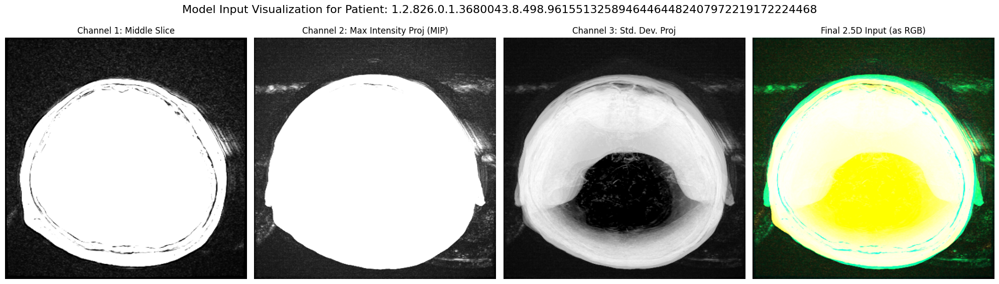

In [17]:
import matplotlib.pyplot as plt
import os
import pydicom
import cv2

# --- 1. Get a Sample Patient ---
COMPETITION_DIR = "/kaggle/input/rsna-intracranial-aneurysm-detection"
SERIES_DIR = os.path.join(COMPETITION_DIR, "series")

# Get the first patient directory available
sample_patient_id = os.listdir(SERIES_DIR)[0]
sample_path = os.path.join(SERIES_DIR, sample_patient_id)

print(f"--- Visualizing input for patient: {sample_patient_id} ---")

# --- 2. Process the DICOM series using the notebook's function ---
# (This assumes the `process_dicom_series` function from cell 4 is in memory)
volume, metadata = process_dicom_series(sample_path)

# --- 3. Create the 2.5D channels (logic copied from `_predict_inner`) ---
# Channel 1: The middle slice of the volume.
middle_slice = volume[CFG.num_slices // 2]

# Channel 2: The Maximum Intensity Projection (MIP).
mip = np.max(volume, axis=0)

# Channel 3: The Standard Deviation Projection.
std_proj = np.std(volume, axis=0).astype(np.float32)

# Normalize the standard deviation projection to the [0, 255] range.
if std_proj.max() > std_proj.min():
    std_proj = ((std_proj - std_proj.min()) / (std_proj.max() - std_proj.min()) * 255).astype(np.uint8)
else:
    std_proj = np.zeros_like(std_proj, dtype=np.uint8)

# Stack the three channels to create the final 3-channel image.
image_2_5d = np.stack([middle_slice, mip, std_proj], axis=-1)

# --- 4. Plot the results ---
fig, axes = plt.subplots(1, 4, figsize=(20, 6))

axes[0].imshow(middle_slice, cmap='gray')
axes[0].set_title("Channel 1: Middle Slice")
axes[0].axis('off')

axes[1].imshow(mip, cmap='gray')
axes[1].set_title("Channel 2: Max Intensity Proj (MIP)")
axes[1].axis('off')

axes[2].imshow(std_proj, cmap='gray')
axes[2].set_title("Channel 3: Std. Dev. Proj")
axes[2].axis('off')

# The 3-channel image is displayed like an RGB image
axes[3].imshow(image_2_5d)
axes[3].set_title("Final 2.5D Input (as RGB)")
axes[3].axis('off')

plt.suptitle(f"Model Input Visualization for Patient: {sample_patient_id}", fontsize=16)
plt.tight_layout()
plt.show()

--- Visualizing POSITIVE case: 1.2.826.0.1.3680043.8.498.62169558538817009391695314359016512306 ---


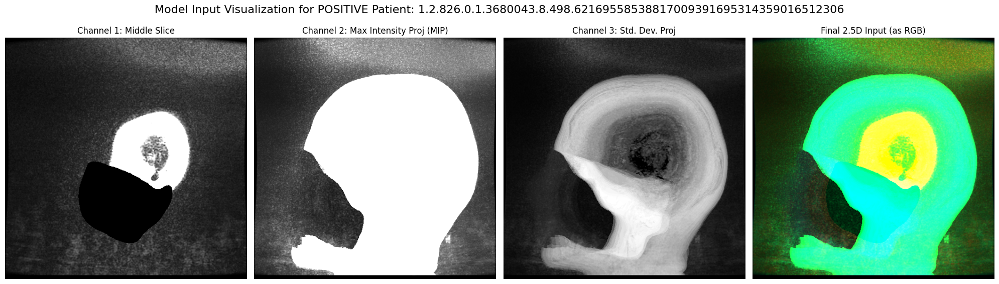

In [18]:
import matplotlib.pyplot as plt
import os
import pydicom
import cv2
import numpy as np # Make sure numpy is imported

# --- 1. Find a GUARANTEED POSITIVE Patient ---
COMPETITION_DIR = "/kaggle/input/rsna-intracranial-aneurysm-detection"
SERIES_DIR = os.path.join(COMPETITION_DIR, "series")
SEGMENTATION_DIR = os.path.join(COMPETITION_DIR, "segmentations")

# Get a list of all segmentation files
all_seg_files = os.listdir(SEGMENTATION_DIR)

# Get the patient ID from the first segmentation file
positive_patient_id = all_seg_files[0].replace('.nii', '')
sample_path = os.path.join(SERIES_DIR, positive_patient_id)

print(f"--- Visualizing POSITIVE case: {positive_patient_id} ---")

# --- 2. Process the DICOM series using the notebook's function ---
# (This assumes the `process_dicom_series` function from cell 4 is in memory)
volume, metadata = process_dicom_series(sample_path)

# --- 3. Create the 2.5D channels (logic copied from `_predict_inner`) ---
# Channel 1: The middle slice of the volume.
middle_slice = volume[CFG.num_slices // 2]

# Channel 2: The Maximum Intensity Projection (MIP).
mip = np.max(volume, axis=0)

# Channel 3: The Standard Deviation Projection.
std_proj = np.std(volume, axis=0).astype(np.float32)

# Normalize the standard deviation projection to the [0, 255] range.
if std_proj.max() > std_proj.min():
    std_proj = ((std_proj - std_proj.min()) / (std_proj.max() - std_proj.min()) * 255).astype(np.uint8)
else:
    std_proj = np.zeros_like(std_proj, dtype=np.uint8)

# Stack the three channels to create the final 3-channel image.
image_2_5d = np.stack([middle_slice, mip, std_proj], axis=-1)

# --- 4. Plot the results ---
fig, axes = plt.subplots(1, 4, figsize=(20, 6))

axes[0].imshow(middle_slice, cmap='gray')
axes[0].set_title("Channel 1: Middle Slice")
axes[0].axis('off')

axes[1].imshow(mip, cmap='gray')
axes[1].set_title("Channel 2: Max Intensity Proj (MIP)")
axes[1].axis('off')

axes[2].imshow(std_proj, cmap='gray')
axes[2].set_title("Channel 3: Std. Dev. Proj")
axes[2].axis('off')

# The 3-channel image is displayed like an RGB image
axes[3].imshow(image_2_5d)
axes[3].set_title("Final 2.5D Input (as RGB)")
axes[3].axis('off')

plt.suptitle(f"Model Input Visualization for POSITIVE Patient: {positive_patient_id}", fontsize=16)
plt.tight_layout()
plt.show()

Generating 4 visualizations...


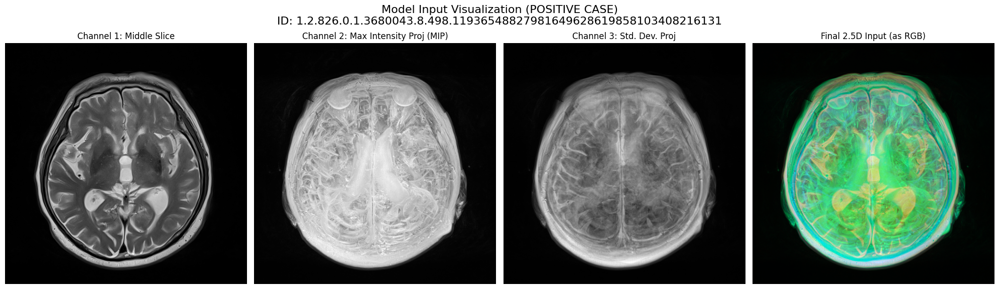

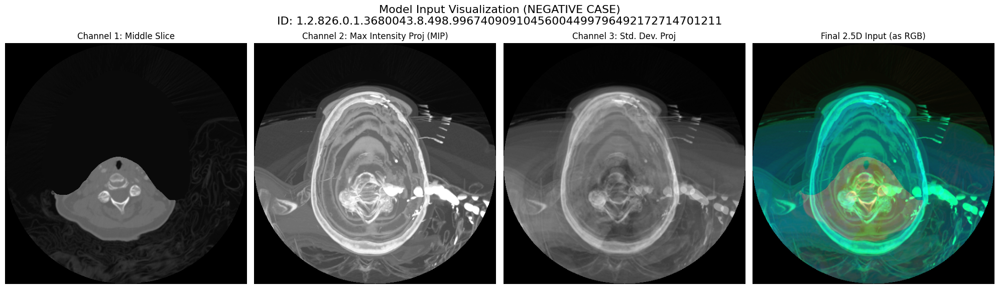

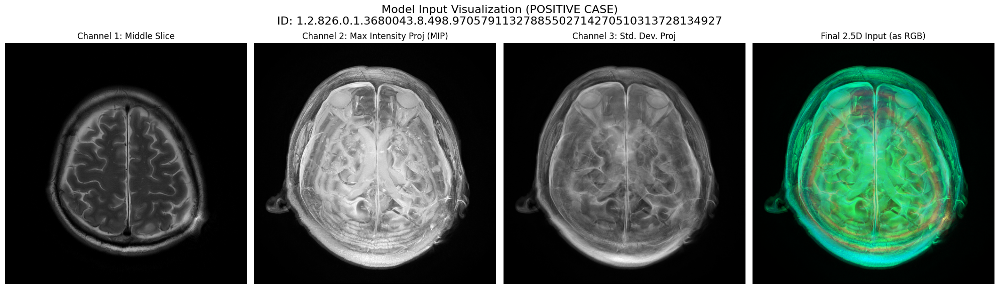

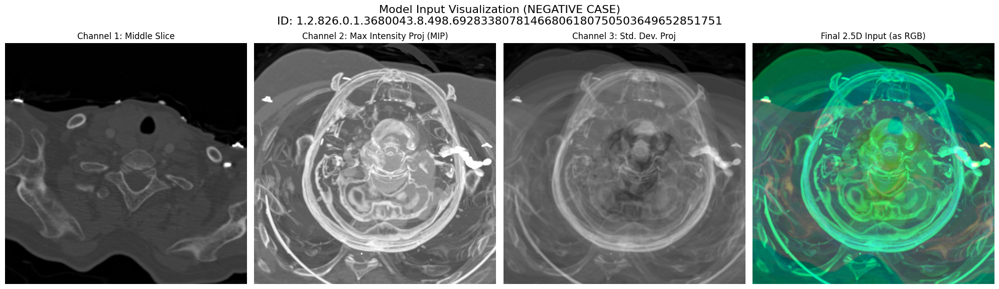

✅ Visualizations complete.


In [24]:
import matplotlib.pyplot as plt
import os
import pydicom
import cv2
import numpy as np
import pandas as pd

# --- 1. Find *Usable* Positive and Negative Cases ---
COMPETITION_DIR = "/kaggle/input/rsna-intracranial-aneurysm-detection"
SERIES_DIR = os.path.join(COMPETITION_DIR, "series")
SEGMENTATION_DIR = os.path.join(COMPETITION_DIR, "segmentations")
TRAIN_CSV_PATH = os.path.join(COMPETITION_DIR, "train.csv")

# Get all *available* patient scan folders
all_series_ids = set(os.listdir(SERIES_DIR))

# Get all *positive* patient IDs from segmentation files
all_positive_ids = set([f.replace('.nii', '') for f in os.listdir(SEGMENTATION_DIR)])

# Find IDs that are *both* positive AND have a scan folder
# This is the corrected, "usable" list
usable_positive_ids = list(all_positive_ids.intersection(all_series_ids))

# Find usable negative IDs
all_train_ids = set(pd.read_csv(TRAIN_CSV_PATH)['SeriesInstanceUID'])
usable_negative_ids = list(all_train_ids - all_positive_ids)
usable_negative_ids = [pid for pid in usable_negative_ids if pid in all_series_ids]


# --- 2. Create a list of 4 patients to visualize ---
patients_to_visualize = [
    (usable_positive_ids[0], "POSITIVE"), # Positive Case 1
    (usable_negative_ids[0], "NEGATIVE"), # Negative Case 1
    (usable_positive_ids[1], "POSITIVE"), # Positive Case 2
    (usable_negative_ids[1], "NEGATIVE")  # Negative Case 2
]

print(f"Generating 4 visualizations...")

# --- 3. Loop and Plot ---
for patient_id, label in patients_to_visualize:
    
    sample_path = os.path.join(SERIES_DIR, patient_id)
    
    # --- Process the DICOM series ---
    try:
        volume, metadata = process_dicom_series(sample_path)
    except Exception as e:
        print(f"Skipping {patient_id}, could not process: {e}")
        continue

    # --- Create the 2.5D channels ---
    middle_slice = volume[CFG.num_slices // 2]
    mip = np.max(volume, axis=0)
    std_proj = np.std(volume, axis=0).astype(np.float32)

    if std_proj.max() > std_proj.min():
        std_proj = ((std_proj - std_proj.min()) / (std_proj.max() - std_proj.min()) * 255).astype(np.uint8)
    else:
        std_proj = np.zeros_like(std_proj, dtype=np.uint8)

    image_2_5d = np.stack([middle_slice, mip, std_proj], axis=-1)

    # --- Plot the results ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 6))
    
    axes[0].imshow(middle_slice, cmap='gray')
    axes[0].set_title("Channel 1: Middle Slice")
    axes[0].axis('off')

    axes[1].imshow(mip, cmap='gray')
    axes[1].set_title("Channel 2: Max Intensity Proj (MIP)")
    axes[1].axis('off')

    axes[2].imshow(std_proj, cmap='gray')
    axes[2].set_title("Channel 3: Std. Dev. Proj")
    axes[2].axis('off')

    axes[3].imshow(image_2_5d)
    axes[3].set_title("Final 2.5D Input (as RGB)")
    axes[3].axis('off')

    plt.suptitle(f"Model Input Visualization ({label} CASE)\nID: {patient_id}", fontsize=16)
    plt.tight_layout()
    plt.show()

print("✅ Visualizations complete.")

Generating 4 visualizations...


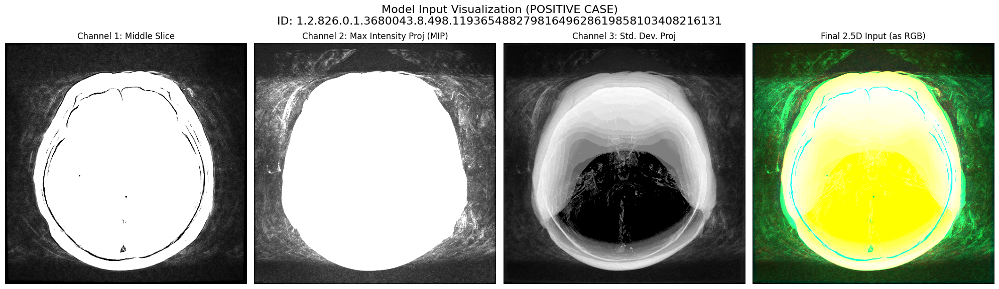

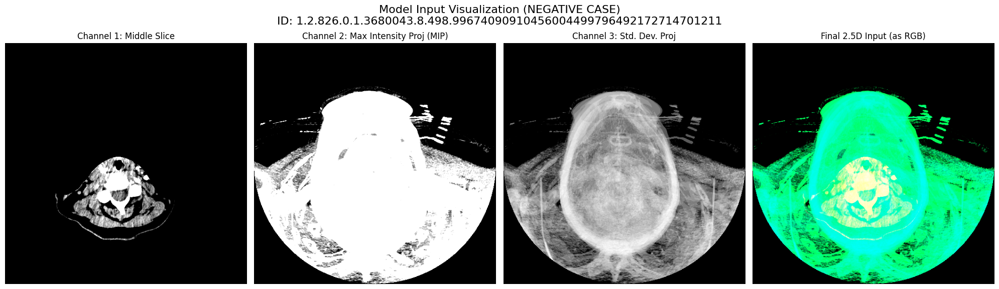

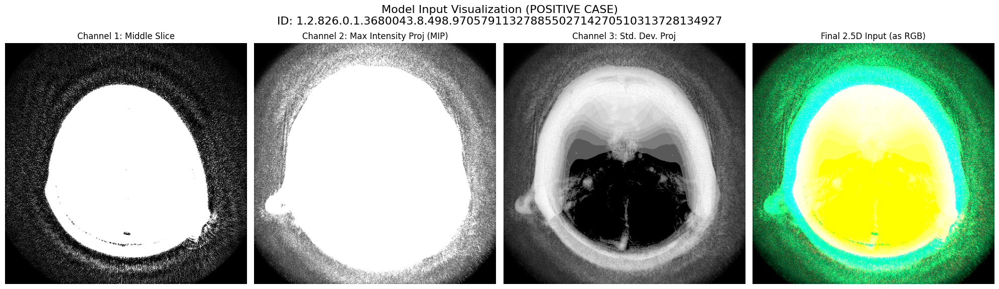

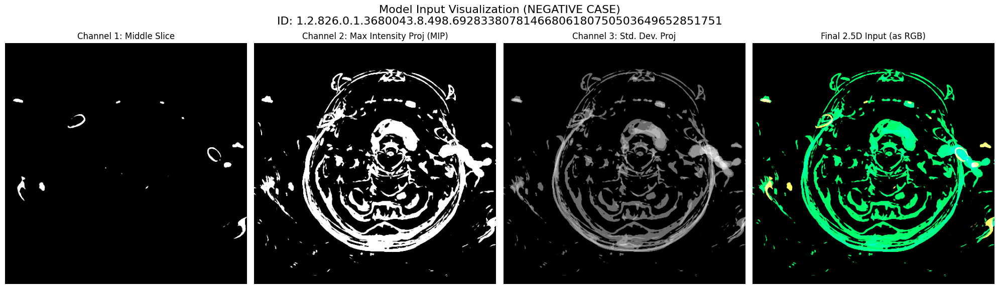

✅ Visualizations complete.


In [26]:
import matplotlib.pyplot as plt
import os
import pydicom
import cv2
import numpy as np
import pandas as pd

# --- 1. Find *Usable* Positive and Negative Cases ---
COMPETITION_DIR = "/kaggle/input/rsna-intracranial-aneurysm-detection"
SERIES_DIR = os.path.join(COMPETITION_DIR, "series")
SEGMENTATION_DIR = os.path.join(COMPETITION_DIR, "segmentations")
TRAIN_CSV_PATH = os.path.join(COMPETITION_DIR, "train.csv")

# Get all *available* patient scan folders
all_series_ids = set(os.listdir(SERIES_DIR))

# Get all *positive* patient IDs from segmentation files
all_positive_ids = set([f.replace('.nii', '') for f in os.listdir(SEGMENTATION_DIR)])

# Find IDs that are *both* positive AND have a scan folder
# This is the corrected, "usable" list
usable_positive_ids = list(all_positive_ids.intersection(all_series_ids))

# Find usable negative IDs
all_train_ids = set(pd.read_csv(TRAIN_CSV_PATH)['SeriesInstanceUID'])
usable_negative_ids = list(all_train_ids - all_positive_ids)
usable_negative_ids = [pid for pid in usable_negative_ids if pid in all_series_ids]


# --- 2. Create a list of 4 patients to visualize ---
patients_to_visualize = [
    (usable_positive_ids[0], "POSITIVE"), # Positive Case 1
    (usable_negative_ids[0], "NEGATIVE"), # Negative Case 1
    (usable_positive_ids[1], "POSITIVE"), # Positive Case 2
    (usable_negative_ids[1], "NEGATIVE")  # Negative Case 2
]

print(f"Generating 4 visualizations...")

# --- 3. Loop and Plot ---
for patient_id, label in patients_to_visualize:
    
    sample_path = os.path.join(SERIES_DIR, patient_id)
    
    # --- Process the DICOM series ---
    try:
        volume, metadata = process_dicom_series(sample_path)
    except Exception as e:
        print(f"Skipping {patient_id}, could not process: {e}")
        continue

    # --- Create the 2.5D channels ---
    middle_slice = volume[CFG.num_slices // 2]
    mip = np.max(volume, axis=0)
    std_proj = np.std(volume, axis=0).astype(np.float32)

    if std_proj.max() > std_proj.min():
        std_proj = ((std_proj - std_proj.min()) / (std_proj.max() - std_proj.min()) * 255).astype(np.uint8)
    else:
        std_proj = np.zeros_like(std_proj, dtype=np.uint8)

    image_2_5d = np.stack([middle_slice, mip, std_proj], axis=-1)

    # --- Plot the results ---
    fig, axes = plt.subplots(1, 4, figsize=(20, 6))
    
    axes[0].imshow(middle_slice, cmap='gray')
    axes[0].set_title("Channel 1: Middle Slice")
    axes[0].axis('off')

    axes[1].imshow(mip, cmap='gray')
    axes[1].set_title("Channel 2: Max Intensity Proj (MIP)")
    axes[1].axis('off')

    axes[2].imshow(std_proj, cmap='gray')
    axes[2].set_title("Channel 3: Std. Dev. Proj")
    axes[2].axis('off')

    axes[3].imshow(image_2_5d)
    axes[3].set_title("Final 2.5D Input (as RGB)")
    axes[3].axis('off')

    plt.suptitle(f"Model Input Visualization ({label} CASE)\nID: {patient_id}", fontsize=16)
    plt.tight_layout()
    plt.show()

print("✅ Visualizations complete.")